# 3. Plotting for Exploratory data analysis (EDA)
http://www.jeannjoroge.com/significance-of-exploratory-data-anaysis/

# (3.1) Basic Terminology

* What is EDA?
* Data-point/vector/Observation
* Data-set.
* Feature/Variable/Input-variable/Dependent-varibale
* Label/Indepdendent-variable/Output-varible/Class/Class-label/Response label
* Vector: 2-D, 3-D, 4-D,.... n-D

Q. What is a 1-D vector: Scalar



## Iris Flower dataset

Toy  Dataset: Iris Dataset: [https://en.wikipedia.org/wiki/Iris_flower_data_set]
* A simple dataset to learn the basics.
* 3 flowers of Iris species. [see images on wikipedia link above]
* 1936 by Ronald Fisher.
* Petal and Sepal: http://terpconnect.umd.edu/~petersd/666/html/iris_with_labels.jpg
*  Objective: Classify a new flower as belonging to one of the 3 classes given the 4 features.
* Importance of domain knowledge.
* Why use petal and sepal dimensions as features?
* Why do we not use 'color' as a feature?



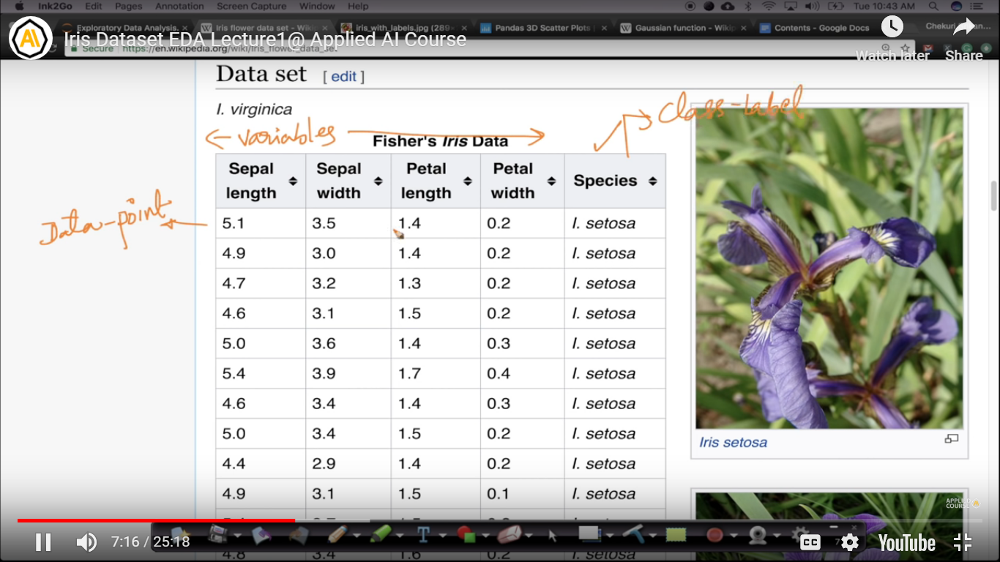

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


'''downlaod iris.csv from https://raw.githubusercontent.com/uiuc-cse/data-fa14/gh-pages/data/iris.csv'''
#Load Iris.csv into a pandas dataFrame.
iris = pd.read_csv("https://raw.githubusercontent.com/uiuc-cse/data-fa14/gh-pages/data/iris.csv")



In [0]:
# (Q) how many data-points and features?
print (iris.shape)

(150, 5)


In [0]:
#(Q) What are the column names in our dataset?
print (iris.columns)

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width',
       'species'],
      dtype='object')


In [0]:
#(Q) How many data points for each class are present? 
#(or) How many flowers for each species are present?

iris["species"].value_counts()
# balanced-dataset vs imbalanced datasets
#Iris is a balanced dataset as the number of data points for every class is 50.

virginica     50
setosa        50
versicolor    50
Name: species, dtype: int64

# (3.2) 2-D Scatter Plot

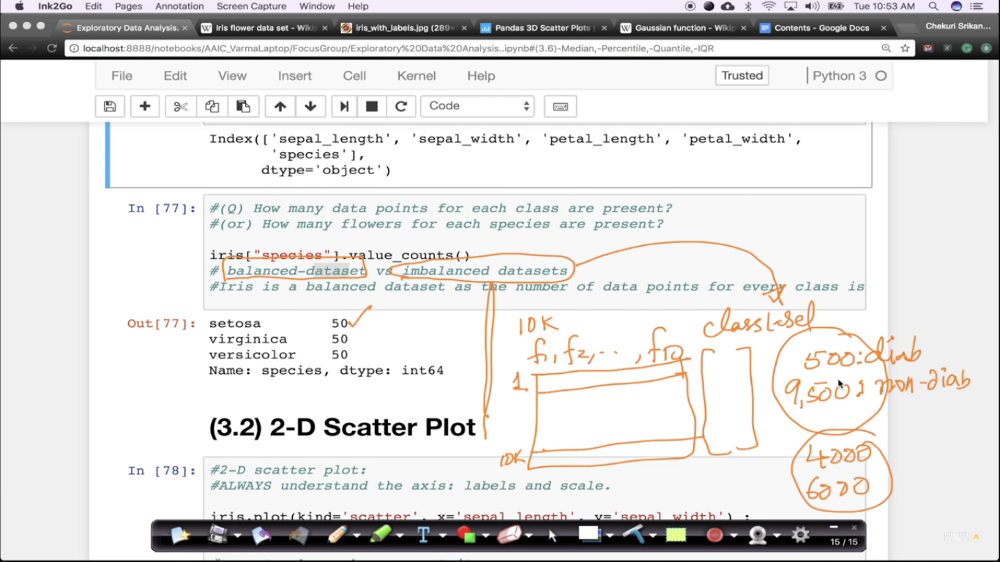

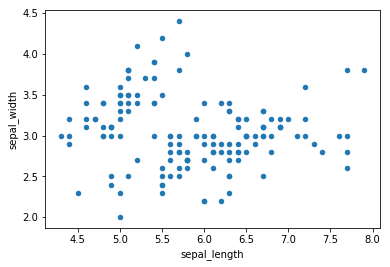

In [0]:
#2-D scatter plot:
#ALWAYS understand the axis: labels and scale.

iris.plot(kind='scatter', x='sepal_length', y='sepal_width') ;
plt.show()

#cannot make much sense out it. 
#What if we color the points by thier class-label/flower-type.

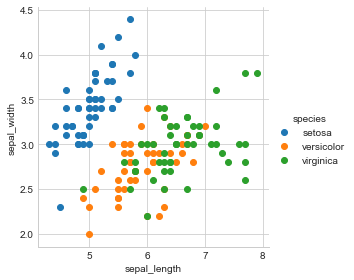

In [0]:
# 2-D Scatter plot with color-coding for each flower type/class.
# Here 'sns' corresponds to seaborn. 
sns.set_style("whitegrid");
sns.FacetGrid(iris, hue="species", size=4) \
   .map(plt.scatter, "sepal_length", "sepal_width") \
   .add_legend();
plt.show();

# Notice that the blue points can be easily seperated 
# from red and green by drawing a line. 
# But red and green data points cannot be easily seperated.
# Can we draw multiple 2-D scatter plots for each combination of features?
# How many cobinations exist? 4C2 = 6.

**Observation(s):**
1. Using sepal_length and sepal_width features, we can distinguish Setosa flowers from others.
2. Seperating Versicolor from Viginica is much harder as they have considerable overlap.

## 3D Scatter plot

https://plot.ly/pandas/3d-scatter-plots/

Needs a lot to mouse interaction to interpret data.

What about 4-D, 5-D or n-D scatter plot?

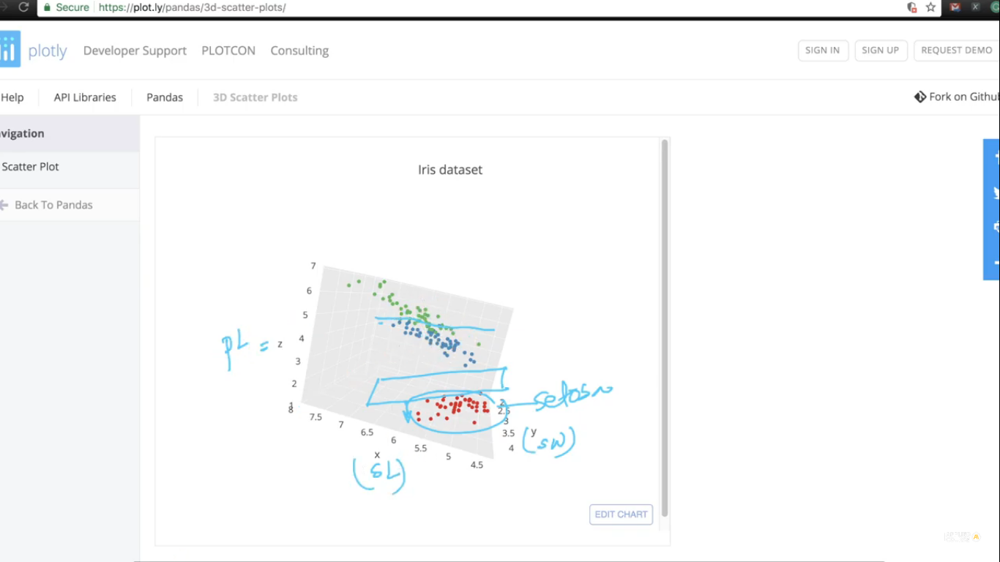

#  (3.3) Pair-plot

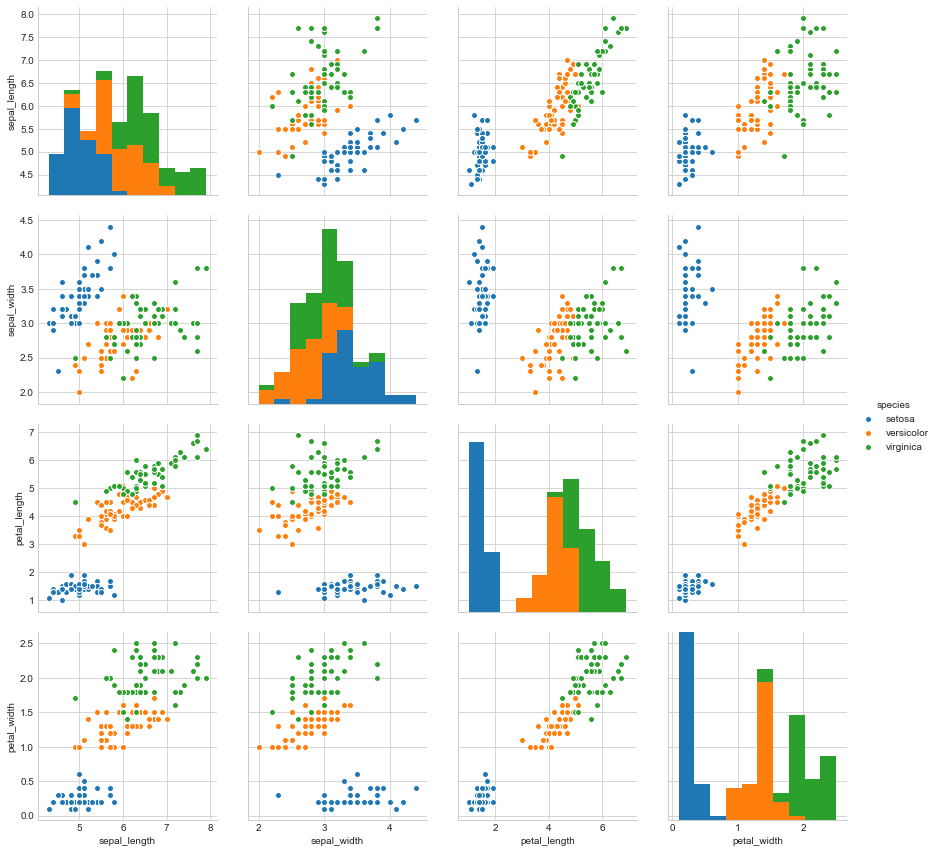

In [0]:
# pairwise scatter plot: Pair-Plot
# Dis-advantages: 
##Can be used when number of features are high.
##Cannot visualize higher dimensional patterns in 3-D and 4-D. 
#Only possible to view 2D patterns.
plt.close();
sns.set_style("whitegrid");
sns.pairplot(iris, hue="species", size=3);
plt.show()
# NOTE: the diagnol elements are PDFs for each feature. PDFs are expalined below.

**Observations**
1. petal_length and petal_width are the most useful features to identify various flower types.
2. While Setosa can be easily identified (linearly seperable), Virnica and Versicolor have some overlap (almost linearly seperable).
3. We can find "lines" and "if-else" conditions to build a simple model to classify the flower types.

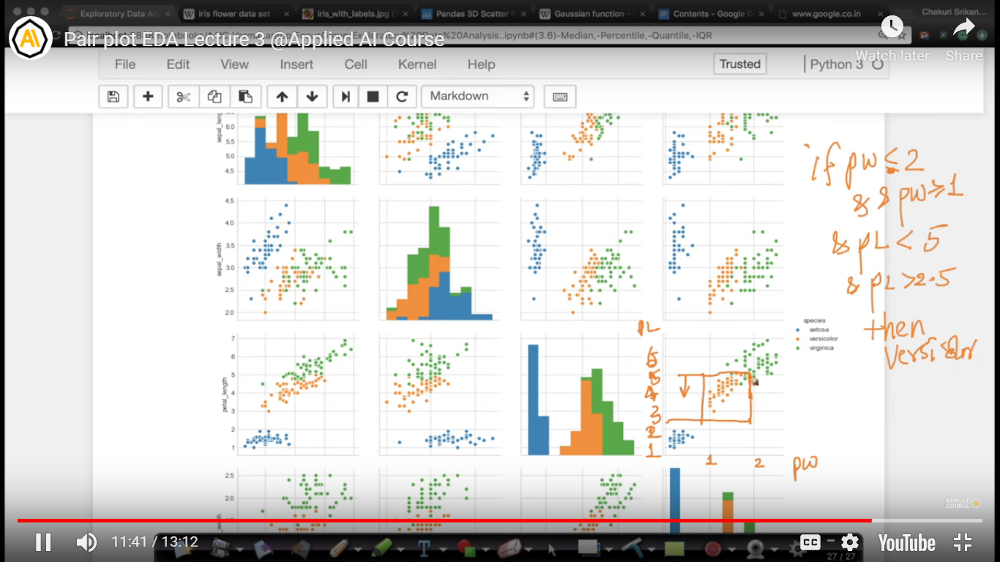

******************************************
Pair plots are useful for basic data anlaysis. It is useful and easy to use if we have fewer features. In cases where we have 100s of features, we can still use pair plots on a subset of features.

In some real world cases, we use ML models to understand which features are most important. We can limit our anlaysis using pair plots only to the most important features.
*********************************************************************
1. Dimension Reduction refers to the process of converting a set of data having more dimensions into data with lesser dimensions ensuring that it conveys similar information concisely. These techniques are typically used while solving machine learning problems to obtain better features for a classification or regression task.

2. pairplot is made when you only want to visualize the relationship between two variables, where the variables can be continous, categorical or booleans. Furthermore, pairplot is usually a grid of plots for each variable in your dataset. Hence you can quickly see how all the variables are related. This can help to infere which variables are useful, which have skewed distribution etc.

# (3.4) Histogram, PDF, CDF

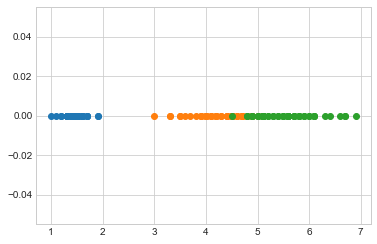

In [0]:
# What about 1-D scatter plot using just one feature?
#1-D scatter plot of petal-length
import numpy as np
iris_setosa = iris.loc[iris["species"] == "setosa"];
iris_virginica = iris.loc[iris["species"] == "virginica"];
iris_versicolor = iris.loc[iris["species"] == "versicolor"];
#print(iris_setosa["petal_length"])
plt.plot(iris_setosa["petal_length"], np.zeros_like(iris_setosa['petal_length']), 'o')
plt.plot(iris_versicolor["petal_length"], np.zeros_like(iris_versicolor['petal_length']), 'o')
plt.plot(iris_virginica["petal_length"], np.zeros_like(iris_virginica['petal_length']), 'o')

plt.show()
#Disadvantages of 1-D scatter plot: Very hard to make sense as points 
#are overlapping a lot.
#Are there better ways of visualizing 1-D scatter plots?

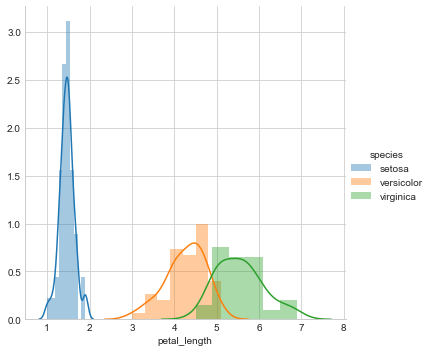

In [0]:
sns.FacetGrid(iris, hue="species", size=5) \
   .map(sns.distplot, "petal_length") \
   .add_legend();
plt.show();



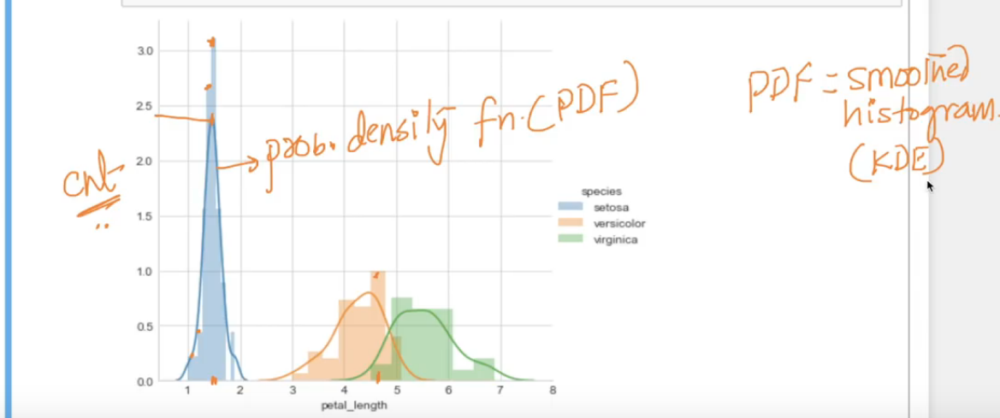

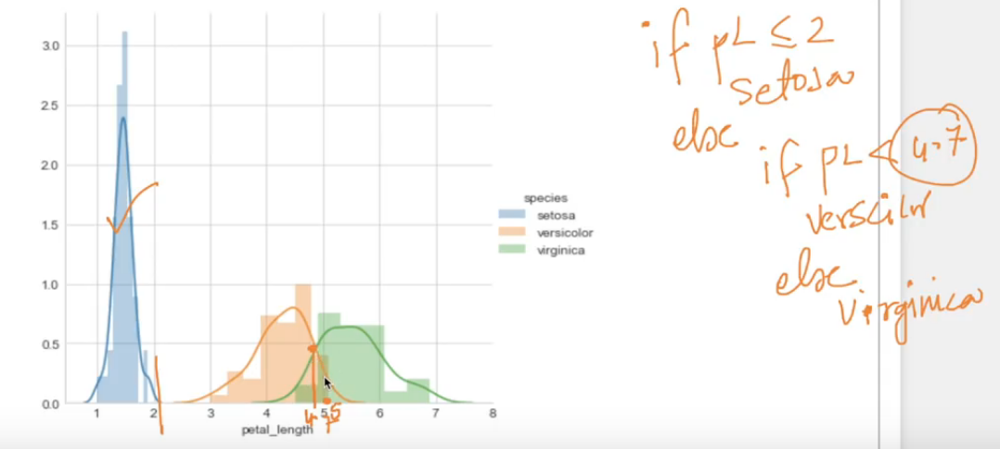

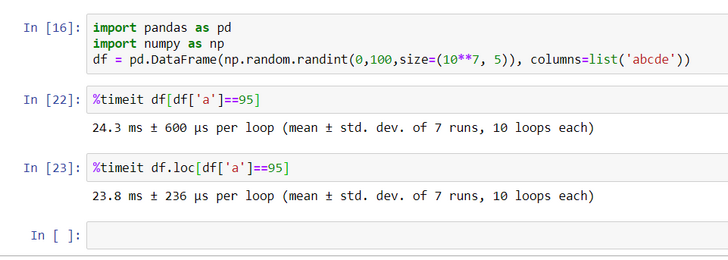

# Comment
In section 3.4 of code ln 39 ---> you have used np.zeros_like().
I understood the explanation that np.zeros_like will create an array of suggested variable i.e petal width.
But my question is , why is it required to create array of 0's..
ideally plot ( X, Y) plot takes X args and Y args, Hence code might look like
plt.plot(iris_setosa["petal_length"], iris_setosa['petal_length'],'o') ... from my understanding.

Could you please help me with my query, why we padded 0's using zeros_like?
thanks in advance

=========================
If we want to builld plots as 'petal_length vs petal_width' or 'petal_length vs sepal_length', etc we can build it using these two features in the plt.plot() as X and Y. But here in univariate analysis., we are trying to build the plots in such a way that all these features will be on X-axis and only 0 values n Y-axis. Here we are bothered representing how the points of different classes are coinciding and how difficult is it to interpret and make conclusions in such case using only one feature.

Let me explain you with the same IRIS example.
Let us assume we have to classify a flower on the basis of 'Petal_Length' feature. So when we are plotting univariate analysis, we see the feature of 'Petal_Length' on X-axis and we will not have any value to represent Y-axis. Also a plot couldn't be built without 2 axes. In that case, we are taking the second feature as zeros so that we will be able to build a scatter plot and then we can show how difficult is it to separate/classify the data points using only one feature.

_________________________________________________________________
Yes, If a random variable is a discrete variable, its probability distribution is called a discrete probability distribution. If a random variable is a continuous variable, its probability distribution is called a continuous probability distribution. Most often, the equation used to describe a continuous probability distribution is called a probability density function. Also, Please check out the comment thread below. If you still have any queries, kindly revert us back.

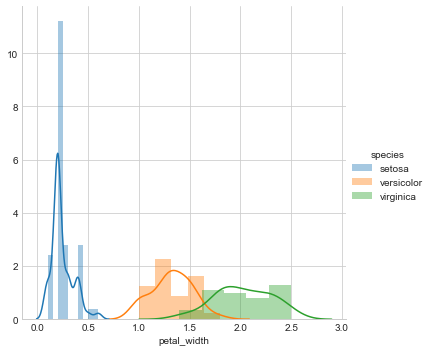

In [0]:
sns.FacetGrid(iris, hue="species", size=5) \
   .map(sns.distplot, "petal_width") \
   .add_legend();
plt.show();

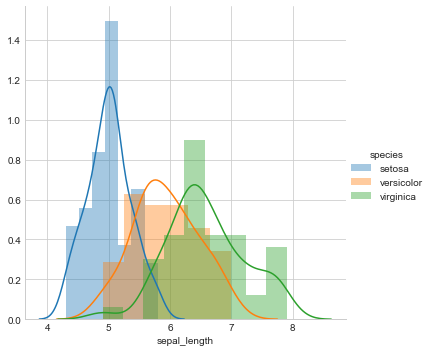

In [0]:
sns.FacetGrid(iris, hue="species", size=5) \
   .map(sns.distplot, "sepal_length") \
   .add_legend();
plt.show();

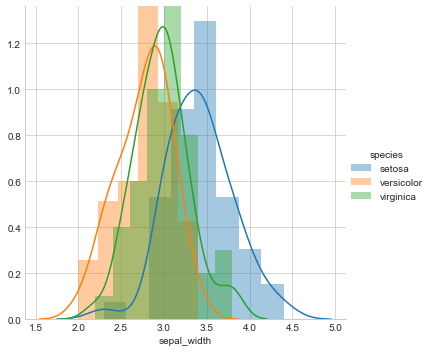

In [0]:
sns.FacetGrid(iris, hue="species", size=5) \
   .map(sns.distplot, "sepal_width") \
   .add_legend();
plt.show();

In [0]:
# Histograms and Probability Density Functions (PDF) using KDE
# How to compute PDFs using counts/frequencies of data points in each window.
# How window width effects the PDF plot.


# Interpreting a PDF:
## why is it called a density plot?
## Why is it called a probability plot?
## for each value of petal_length, what does the value on y-axis mean?
# Notice that we can write a simple if..else condition as if(petal_length) < 2.5 then flower type is setosa.
# Using just one feature, we can build a simple "model" suing if..else... statements.

# Disadv of PDF: Can we say what percentage of versicolor points have a petal_length of less than 5?

# Do some of these plots look like a bell-curve you studied in under-grad?
# Gaussian/Normal distribution.
# What is "normal" about normal distribution?
# e.g: Hieghts of male students in a class.
# One of the most frequent distributions in nature.


# Comments:---
The probability associated with an interval of values say (a,b) and it is symbolically represented as : P ( a < X < b ) . This probability is the area under the curve of Probability Density Function ( PDF ) from a to b . So probabilities can be evaluated by integrating the PDF of the random variable . The above relationship defines the PDF .

In other words When the PDF is graphically portrayed, the area under the curve will indicate the interval in which the variable will fall. The total area in this interval of the graph equals the probability of a continuous random variable occurring. Now if we take any two values in this interval and try to find the area under the curve for that interval what we will receive will be the probability for the event to happen in that interval. The PDF is used to specify this probability of the random variable falling within a particular range of values, as opposed to taking on one value

===============================================
#"How can I use PDF while creating models ?


"- Probability Density Function (PDF) is used for univariate analysis. Univariate analysis as the name suggests is a single variable analysis. So, PDF is very helpful when we have to dig deeper into a particular feature.
A histogram is a plot of the data you have collected. It can give you an idea about how the probability distribution of your measurement looks, but it cannot give you an accurate figure for the probability for how often your measurement falls some distance away from the mean, especially as you go further away from the mean.

For example, in our classroom we have 100 students. Since each student will have a unique height the probability for any value will be 0 which is not a very useful number for us as the height can take infinitesimal number of possibilities. In such cases we will use PDF where we will give an interval for which the probability will be computed. Here, if we want to find the probability of student with height of 103 to 107 we will get a probability of say 0.48 or 48%. Now this information is useful for the recipient if he would like to arrive at certain conclusion regarding his theory to check the height of students in that range.

Hence, For continuous random variables, the probability that X takes on any particular value x is 0. i.e. finding P(X = x) for a continuous random variable X is not going to work. Instead, we’ll need to find the probability that X falls in some interval (a, b), that is, we’ll need to find P(a < X < b). We’ll do that using a probability density function (PDF).

[ 0.02  0.02  0.04  0.14  0.24  0.28  0.14  0.08  0.    0.04]
[ 1.    1.09  1.18  1.27  1.36  1.45  1.54  1.63  1.72  1.81  1.9 ]


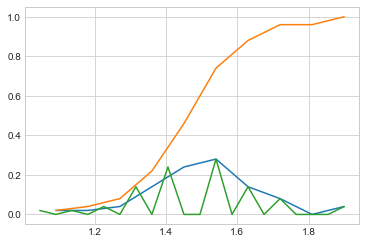

In [0]:

# Need for Cumulative Distribution Function (CDF)
# We can visually see what percentage of versicolor flowers have a 
# petal_length of less than 5?
# How to construct a CDF?
# How to read a CDF?

#Plot CDF of petal_length

counts, bin_edges = np.histogram(iris_setosa['petal_length'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges);
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf);
plt.plot(bin_edges[1:], cdf)


counts, bin_edges = np.histogram(iris_setosa['petal_length'], bins=20, 
                                 density = True)
pdf = counts/(sum(counts))
plt.plot(bin_edges[1:],pdf);

plt.show();


[ 0.02  0.02  0.04  0.14  0.24  0.28  0.14  0.08  0.    0.04]
[ 1.    1.09  1.18  1.27  1.36  1.45  1.54  1.63  1.72  1.81  1.9 ]


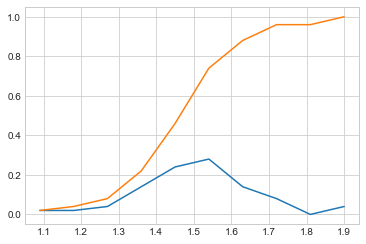

In [0]:
# Need for Cumulative Distribution Function (CDF)
# We can visually see what percentage of versicolor flowers have a 
# petal_length of less than 1.6?
# How to construct a CDF?
# How to read a CDF?

#Plot CDF of petal_length

counts, bin_edges = np.histogram(iris_setosa['petal_length'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)

#compute CDF
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf)



plt.show();

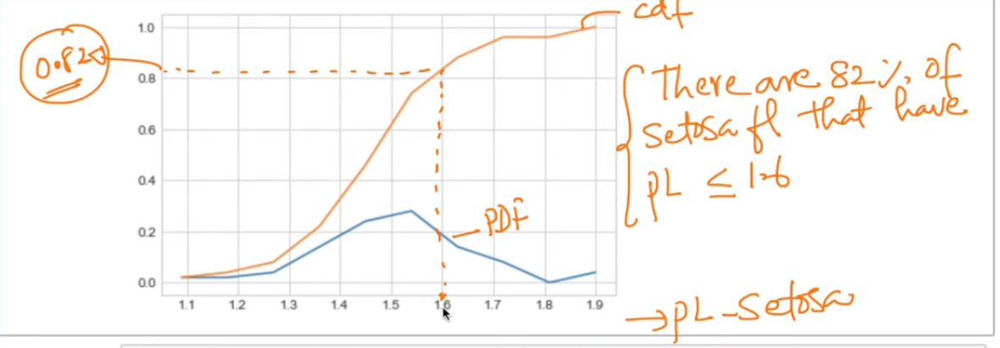

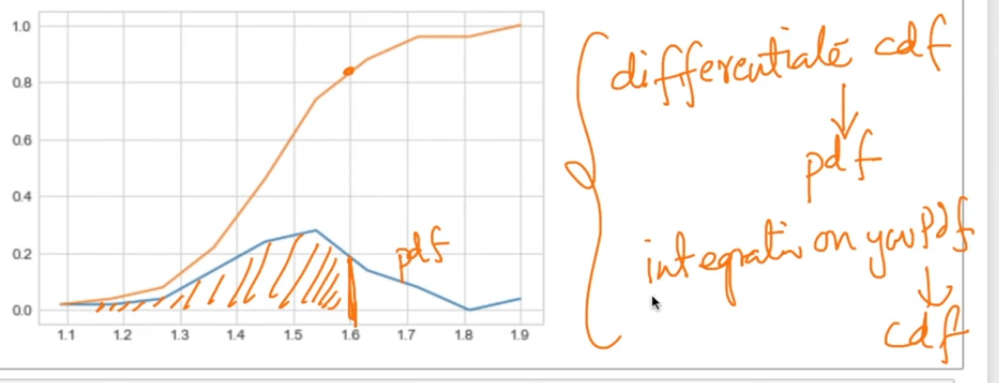

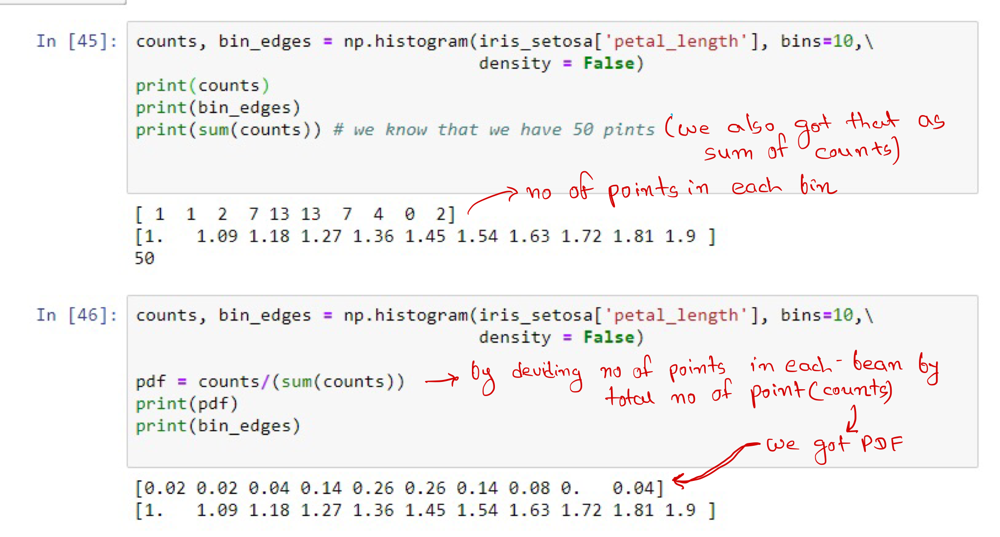

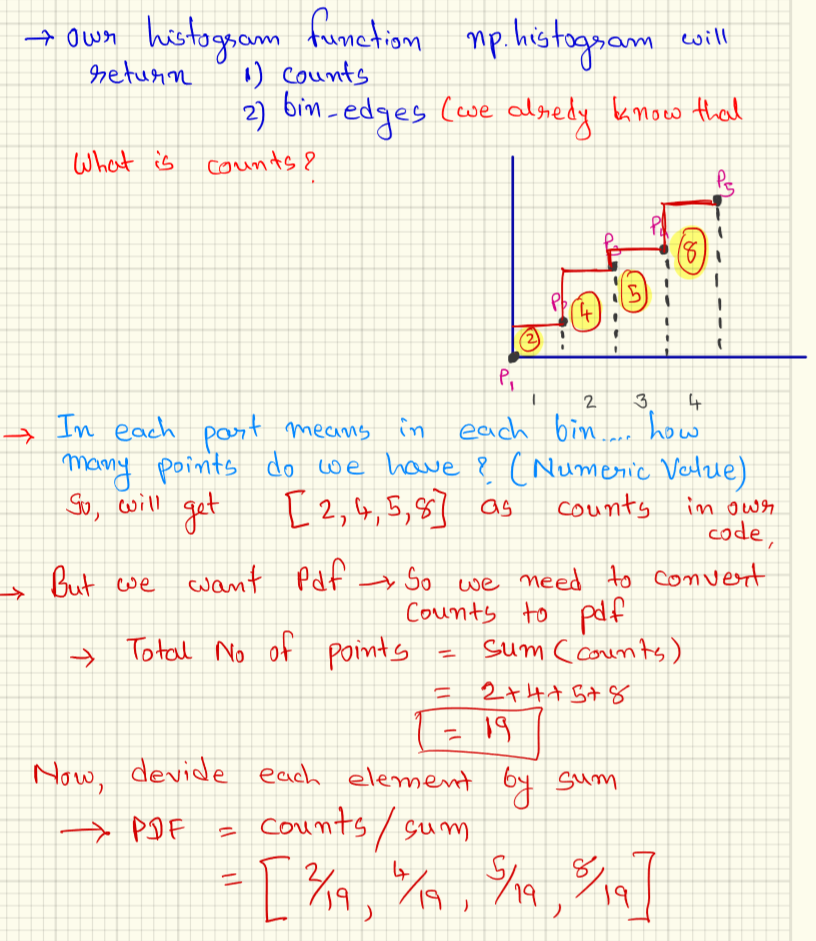

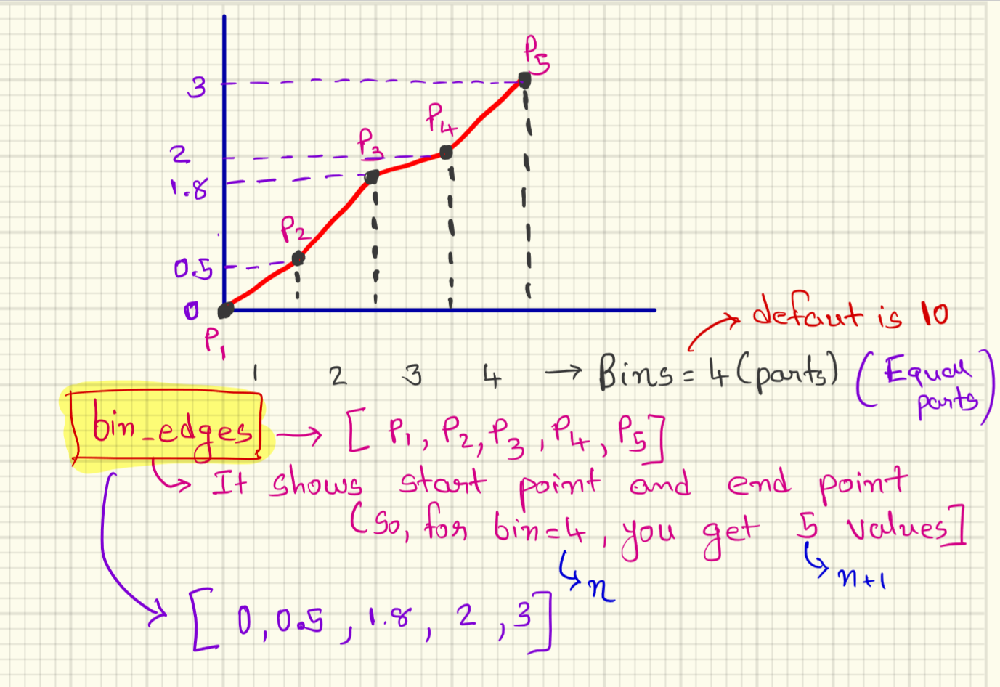

In [3]:
# your code goes here
# your code goes here
import numpy as np
# consider you have an array like this
a= [1, 2, 3, 5, 10,11, 12, 13, 14, 15, 21,23, 25, 26, 27, 29, 30,31, 35, 51]
# here we have decided to group all these numbers into 5 bins
# i.e bins = 5
# the minimum number in the array is 1
# the maximum number in the array is 51
# the width of each bin is calculated as = ((max - min) / bins)
# width of each bin = (51-1)/5 = 10
# Since we got each bin with as 10, we can choose the bin edges like this
# 1 ...... 11 ....... 21 ........ 31 ....... 41 ....... 51
# |---10---|----10----|----10-----|----10----|----10----|
# so we have found out the bin edges now
# to find thte counts we calcuate how many number of points fall into each bin
# therefore the count of a bin = number of elements of a such that left_bin_egde<=ai<right_bin_edges
# i. number of elements belongs to the 1st bin 1<=x<11 => 5 [1,2,3,5,10]
# ii. number of elements belongs to the 2nd bin 11<=x<21 => 5 [11,12,13,14,15]
# iii. number of elements belongs to the 3rd bin 21<=x<31 => 7 [21,23,25,26,27,29,30]
# iii. number of elements belongs to the 3rd bin 21<=x<31 => 7 [21,23,25,26,27,29,30]
# iv. number of elements belongs to the 4th bin 31<=x<41 => 2 [31,35]
# v. number of elements belongs to the 5th bin 41<=x<=51 => 1 [51]

# note: from the documentation: https://d...content-available-to-author-only...y.org/doc/numpy/reference/generated/numpy.histogram.html
# All but the last (righthand-most) bin is half-open i.e [1,2,3,4], the bins are [1,2), [2,3), [3,4]
print('='*30, "explaining 'bin edges and counts",'='*30)
counts,bins = np.histogram(a, bins=5)

print("bin edges :",bins)
print("counts per each bin :",counts)

# density : bool, optional
# If False, the result will contain the number of samples in each bin. 
# If True, the result is the value of the probability density function at the bin, normalized such that the integral over the range is 1. 
# Note that the sum of the histogram values will not be equal to 1 unless bins of unity width are chosen;
# it is not a probability mass function.

# and from the source code
#if density:
#        db = np.array(np.diff(bin_edges), float)
#        return n/db/n.sum(), bin_edges

# here the n => number of elements for each bin
n = counts
# and db = difference between bin edges
db = np.array(np.diff(bins))
# n.sum() number of all the elemnts 


print('='*30, "explaining 'density=True' parameter",'='*30)
print("manual calculated densities for each bin",counts/db/counts.sum())

counts, bins = np.histogram(a, bins=5, density=True)

print("bin edges :",bins)
print("counts per each bin using density=True:",counts)

print('='*30, "explaining counts/sum(counts)",'='*30)
# pleasen note that the documentation says when you have density=True, 
# "that the sum of the histogram values will not be equal to 1"

# this is simple logic we used, to make the whole sum=1, we have devided each element by the number of whole elemnets

counts, bins = np.histogram(a, bins=5, density=True)

print("bin edges :",bins)
print("counts per each bin using density=True:",counts/sum(counts))

============================== explaining 'bin edges and counts ==============================
bin edges : [ 1. 11. 21. 31. 41. 51.]
counts per each bin : [5 5 7 2 1]
============================== explaining 'density=True' parameter ==============================
manual calculated densities for each bin [0.025 0.025 0.035 0.01  0.005]
bin edges : [ 1. 11. 21. 31. 41. 51.]
counts per each bin using density=True: [0.025 0.025 0.035 0.01  0.005]
============================== explaining counts/sum(counts) ==============================
bin edges : [ 1. 11. 21. 31. 41. 51.]
counts per each bin using density=True: [0.25 0.25 0.35 0.1  0.05]


# Check my understanding about this concept
1.# How bin width effects the PDF plot.
ans -> As we take the bin size smaller and smaller we are going towards the more and more accurate decisions? Am i right?

2. why is it called a density plot?
sol-> because each bin size refer to the density of the bin or (in more high level,we can say storage). the bin which has the more density that actually has the high probability and
the bin which has the less density that actually has the low probability. density is calculating by just how many data points it has divide by total datapoints in the dataset.


3.Why is it called a probability plot?
sol-> because we can calculate the probability of the interval means if we find new petal_length then what is the probablity actuallly it'll acutally place that interval.

4. what actually cdf is? how it differ from pdf ?
sol-> cdf-> If we take a single point in the x-axis -> By cdf we can calculate how much percent (x-axis values)less than this.
pdf-> SO with the pdf we can't calulate like if we give one point what percentage of values less than this. but by pdf we can calcualte the intervals like (in 15-10 intreval) the probability of event happens is 50%.

[ 0.02  0.02  0.04  0.14  0.24  0.28  0.14  0.08  0.    0.04]
[ 1.    1.09  1.18  1.27  1.36  1.45  1.54  1.63  1.72  1.81  1.9 ]
[ 0.02  0.1   0.24  0.08  0.18  0.16  0.1   0.04  0.02  0.06]
[ 4.5   4.74  4.98  5.22  5.46  5.7   5.94  6.18  6.42  6.66  6.9 ]
[ 0.02  0.04  0.06  0.04  0.16  0.14  0.12  0.2   0.14  0.08]
[ 3.    3.21  3.42  3.63  3.84  4.05  4.26  4.47  4.68  4.89  5.1 ]


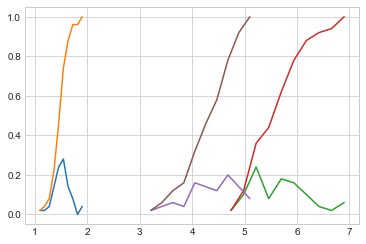

In [0]:
# Plots of CDF of petal_length for various types of flowers.

# Misclassification error if you use petal_length only.

counts, bin_edges = np.histogram(iris_setosa['petal_length'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf)


# virginica
counts, bin_edges = np.histogram(iris_virginica['petal_length'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf)


#versicolor
counts, bin_edges = np.histogram(iris_versicolor['petal_length'], bins=10, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf)
plt.plot(bin_edges[1:], cdf)


plt.show();

# (3.5) Mean, Variance and Std-dev

In [0]:
#Mean, Variance, Std-deviation,  
print("Means:")
print(np.mean(iris_setosa["petal_length"]))
#Mean with an outlier.
print(np.mean(np.append(iris_setosa["petal_length"],50)));
print(np.mean(iris_virginica["petal_length"]))
print(np.mean(iris_versicolor["petal_length"]))

print("\nStd-dev:");
print(np.std(iris_setosa["petal_length"]))
print(np.std(iris_virginica["petal_length"]))
print(np.std(iris_versicolor["petal_length"]))





Means:
1.464
2.41568627451
5.552
4.26

Std-dev:
0.171767284429
0.546347874527
0.465188133985


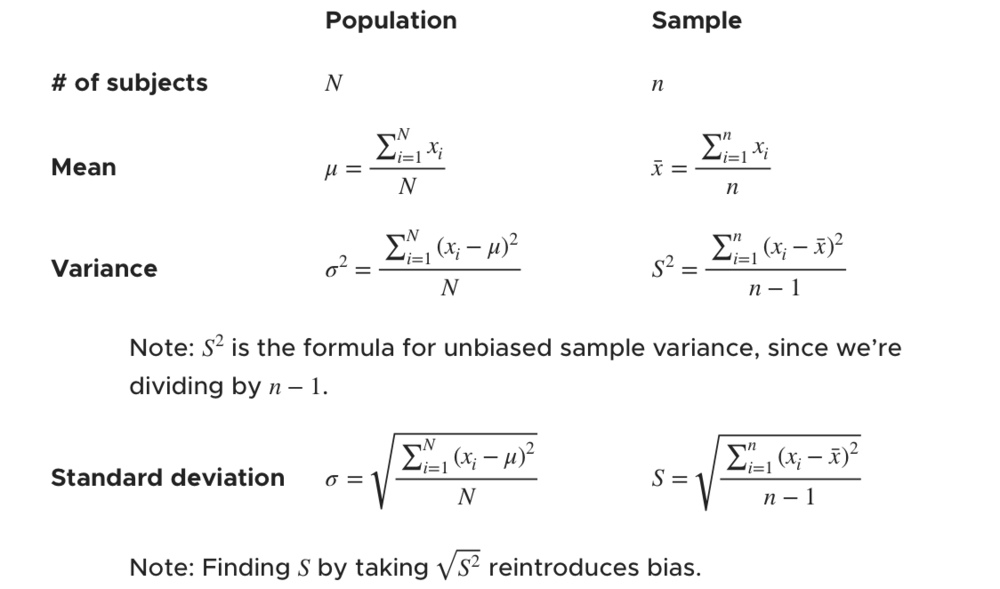

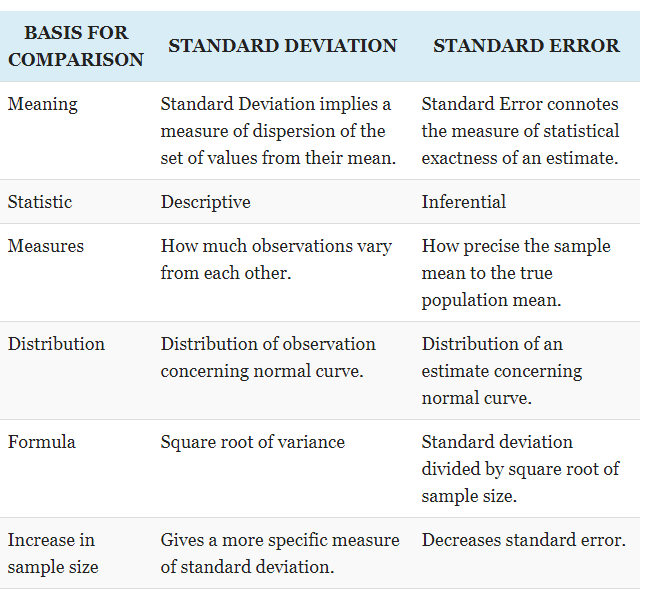
https://keydifferences.com/difference-between-standard-deviation-and-standard-error.html

1. The standard deviation is expressed in the same units as the mean is, whereas the variance is expressed in squared units, but for looking at a distribution, you can use whatever suits you. For example, you use SD to explain the percentage of data points lying in a range(65% of the data points lie in the 1st standard deviation from mean in a normal distribution).
2. Neither standard deviation nor the variance can be negative and thus there is no question of negative values.
----------------------------------
=======================================
#https://soundcloud.com/applied-ai-course/variance-vs-std-dev
#https://soundcloud.com/applied-ai-course/std-dev-usage
#https://soundcloud.com/user-680812749/hi-low-std

Scaling is just one of the applications of std-dev which is used a lot in ML algos.

#Q1. How will the data analyst actions change if std-dev is large or small?

#Ans 1: This is a very problem, data and domain-specific thing. Here are some possible conclusion based don std-dev:

#a. The variability in the data is large as explained in my audio-snippet.
#b. There could be outliers in data. Not necessarily always. If data has extreme outliers, it tends to increase the std-dev.
#c. It can help us give confidence intervals to some metrics. If std-dev is large, it could imply that the confidence intervals would tend to be wide.
#d. In stock-trading, std-dev is a simple measure of the volatility of a stock.

---------------------------------

Whenever you are dealing with features or parameters that differ from each other in terms of range of values (which is the case in most of data sets) then you have to normalise/standardize the data so that the difference in these range of values does not affect your outcome. For e.g you want to see how speed of running of an athlete depends on his weight and height. Here the factors will be height and weight. Height ranges from say 4 feet to 7 feet while weight ranges from say 50 kgs to 120 kgs. If we feed in these factors in the model as it is then the model will give a higher weightage to weight as compared to height because the values for weights are larger than heights. This may not give us desired results. To overcome this, we would have to rescale or standardise the two features so that their range is comparable.

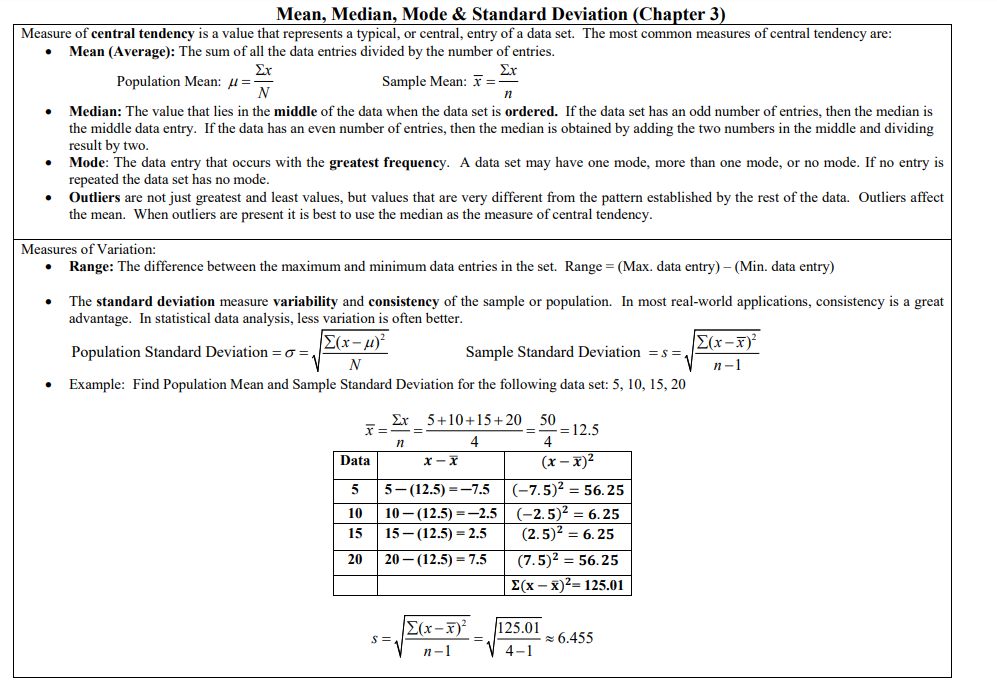

# (3.6) Median, Percentile, Quantile, IQR, MAD

In [0]:
#Median, Quantiles, Percentiles, IQR.
print("\nMedians:")
print(np.median(iris_setosa["petal_length"]))
#Median with an outlier
print(np.median(np.append(iris_setosa["petal_length"],50)));
print(np.median(iris_virginica["petal_length"]))
print(np.median(iris_versicolor["petal_length"]))


print("\nQuantiles:")
print(np.percentile(iris_setosa["petal_length"],np.arange(0, 100, 25)))
print(np.percentile(iris_virginica["petal_length"],np.arange(0, 100, 25)))
print(np.percentile(iris_versicolor["petal_length"], np.arange(0, 100, 25)))

print("\n90th Percentiles:")
print(np.percentile(iris_setosa["petal_length"],90))
print(np.percentile(iris_virginica["petal_length"],90))
print(np.percentile(iris_versicolor["petal_length"], 90))

from statsmodels import robust
print ("\nMedian Absolute Deviation")
print(robust.mad(iris_setosa["petal_length"]))
print(robust.mad(iris_virginica["petal_length"]))
print(robust.mad(iris_versicolor["petal_length"]))



Medians:
1.5
1.5
5.55
4.35

Quantiles:
[ 1.     1.4    1.5    1.575]
[ 4.5    5.1    5.55   5.875]
[ 3.    4.    4.35  4.6 ]

90th Percentiles:
1.7
6.31
4.8

Median Absolute Deviation
0.148260221851
0.667170998328
0.518910776477


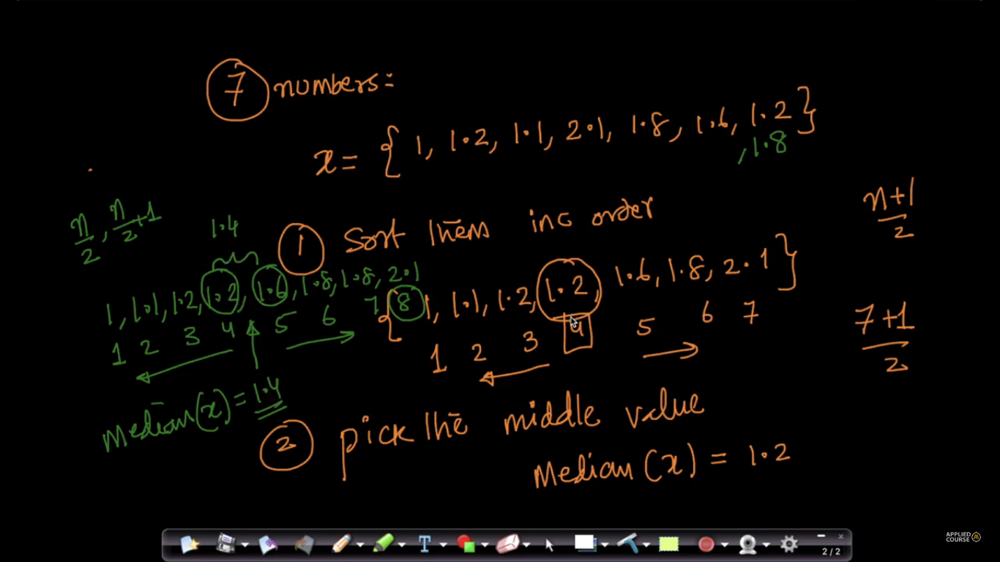
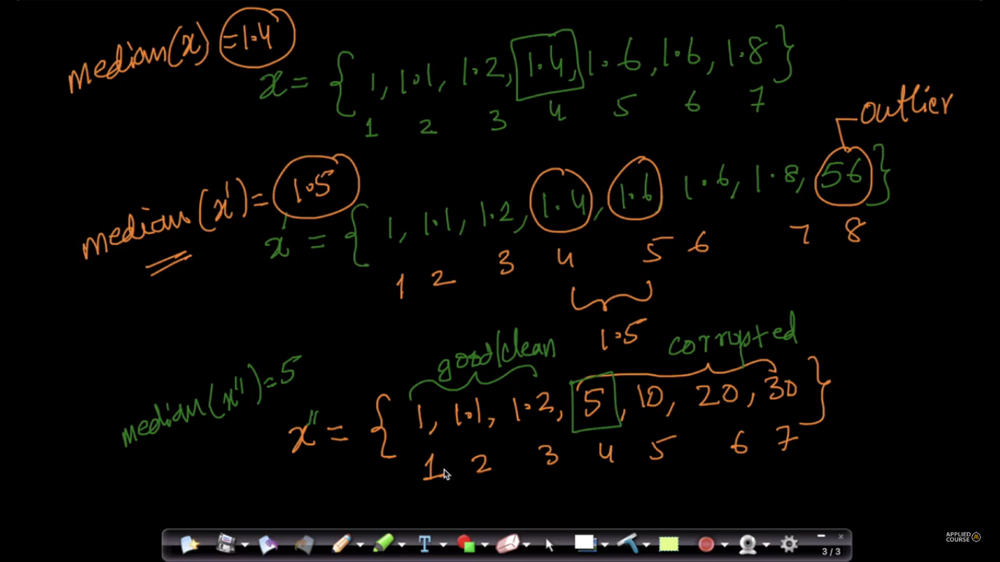

#1. Please go through this thread here. You'll understand the difference between continuous and discrete data: https://stats.stackexchange.com/questions/206/what-is-the-difference-between-discrete-data-and-continuous-data
#2. Skewness is asymmetry in a statistical distribution, in which the curve appears distorted or skewed either to the left or to the right.
#3. If most of the data are on the left side of the histogram but a few larger values are on the right, the data are said to be skewed to the right. subplot A in this plot:https://imgur.com/fsLP6lj. The mean is larger than the median in this case.
#4. If most of the data are on the right, with a few smaller values showing up on the left side of the histogram, the data are skewed to the left. subplot B in this plot:https://imgur.com/fsLP6lj. The mean is lesser than the median in this case.
#5. If the data is symmetric, they have about the same shape on either side of the center. In other words, if you fold the histogram in half, it looks about the same on both sides. subplot C in this plot:https://imgur.com/fsLP6lj. The mean is the same as the median. (Here mode might be different for bimodal distributions. Have a look at this: https://www.statisticshowto.datasciencecentral.com/what-is-a-bimodal-distribution/).

-----------------------------
#1. The mean is the more commonly used measure of the two. Moreover, it is the basis of many advanced statistical methods. For example, the mean is needed to calculate the standard deviation, which is the most prominent measure to assess the variability in a set of data. For a lot of analysis, the mean is very useful. Indeed, if you’re trying to understand data that falls under a normal curve, the mean can tell you a lot of information, because it gives you an overall average score for the group. And it is also needed for many statistical testing procedures, e.g. for the t-test.

#2. The mean has one main disadvantage: it is particularly susceptible to the influence of outliers. These are values that are unusual compared to the rest of the data set by being especially small or large in numerical value so median would be a better measure of central tendency in this situation.

#Another time when we usually prefer the median over the mean (or mode) is when our data is skewed (i.e., the frequency distribution for our data is skewed). If we consider the normal distribution - as this is the most frequently assessed in statistics - when the data is perfectly normal, the mean, median and mode are identical. Moreover, they all represent the most typical value in the data set. However, as the data becomes skewed the mean loses its ability to provide the best central location for the data because the skewed data is dragging it away from the typical value. However, the median best retains this position and is not as strongly influenced by the skewed values.

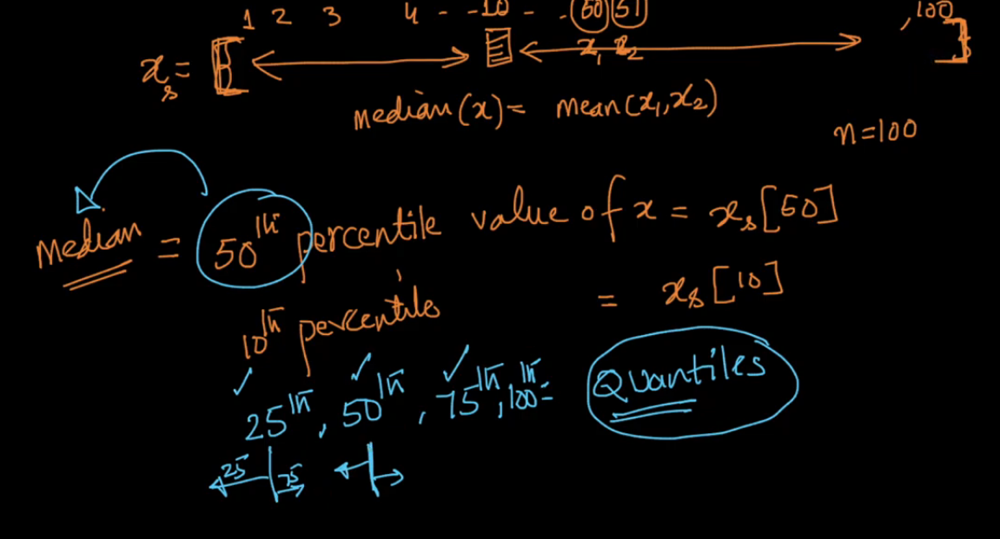

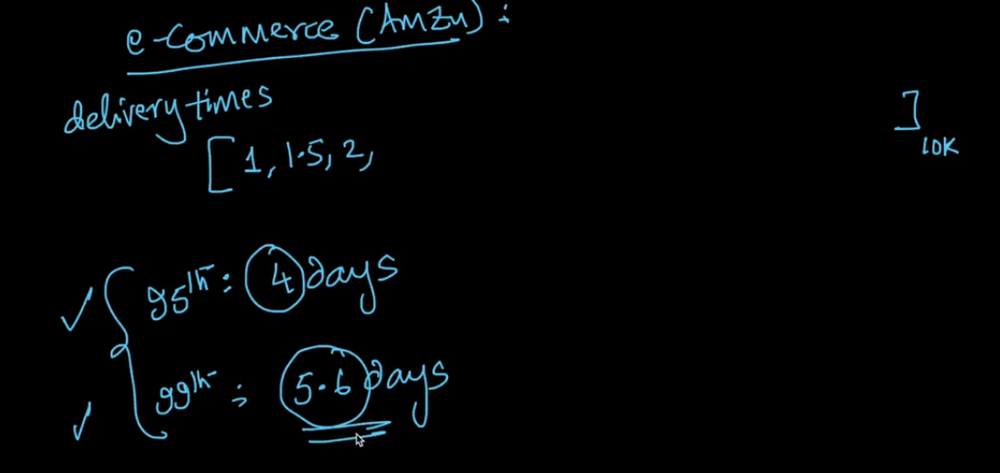

Here we can analyze that 99 percentile customers got product delivered in 5.6 days so what can we do to make that to 4 days that 95 percentile of customers are getting.
 The first step in improving a supply chain system is to measure how good or bad it is. 95th and 99th percentile values help us quantify (or) measure the state of our supply chain. Now supply chain managers can try various operational methods like adding more trucks, adding more delivery personnel etc. Once they make any change, they can measure how much the change impacts the overall system by again looking at 99th percentile values to see if they improved. These metrics can help the managers track progress as they implement new changes over time.

# Quartile vs quantile
A quartile is a type of quantile. The first quartile (Q1) is defined as the middle number between the smallest number and the median of the data set. The second quartile (Q2) is the median of the data. The third quartile (Q3) is the middle value between the median and the highest value of the data set

quantiles are cut points dividing the range of a probability distribution into contiguous intervals with equal probabilities, or dividing the observations in a sample in the same way. There is one less quantile than the number of groups created. Thus quartiles are the three cut points that will divide a dataset into four equal-sized groups

#https://www.quora.com/Why-are-quantiles-important-in-statistics
#http://web.mnstate.edu/peil/MDEV102/U4/S36.pdf

A percentile is a measure used in statistics indicating the value below which a given percentage of observations in a group of observations falls.It is one of the equal divisions of an amount, expressed on a scale from 0 to 100.
The CDF is the function that maps values to their percentile rank in a distribution.It is a function of x, where x is any value that might appear in the distribution.
Using the CDF we can determine the probability that a data value x is less than or equal to a certain value, higher than a certain value, or between two values.
Calculating a percentile (or a p-quantile) is equivalent to finding the inverse of a CDF(in the usual sense, i.e., inverse of a function).This function is almost identical to both,for cdf the result is in a probability in the range 0–1 rather than a percentile rank in the range 0–100.


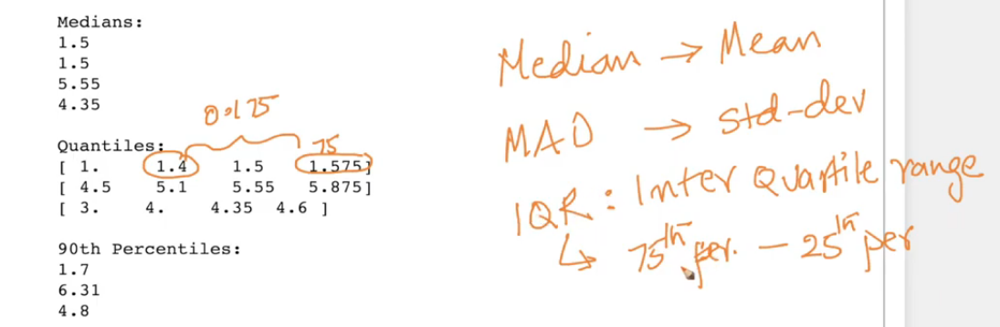

Absolute deviations are less sensitive to extreme outliers (values far from the mean/trendline) compared to standard deviations because they don't square that distance before adding it to the values from other data points. The real reasons why SD is used more often is because the maths is easier to work with ... furthermore, it's easier computationally (both because medians require "sorting", and because squares are faster to compute than branch statements). Using absolute deviations reduces this distortion, but at the cost of making calculation of the trendline more complicated.
#https://soundcloud.com/applied-ai-course/mad-usage

# (3.7) Box plot and Whiskers

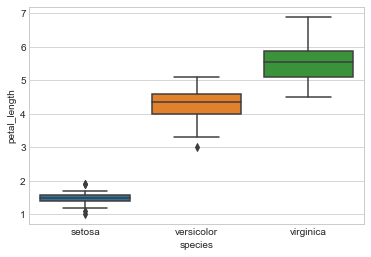

In [0]:

#Box-plot with whiskers: another method of visualizing the  1-D scatter plot more intuitivey.
# The Concept of median, percentile, quantile.
# How to draw the box in the box-plot?
# How to draw whiskers: [no standard way] Could use min and max or use other complex statistical techniques.
# IQR like idea.

#NOTE: IN the plot below, a technique call inter-quartile range is used in plotting the whiskers. 
#Whiskers in the plot below donot correposnd to the min and max values.

#Box-plot can be visualized as a PDF on the side-ways.

sns.boxplot(x='species',y='petal_length', data=iris)
plt.show()

Whiskers are extended based on the following conditions:
The value/Extent of whiskers are decided based on minimum value of the following two conditions:
#(1) + or - 1.5 * IQR
#(2) Maximum / Minimum value present in the data set.
#>The whiskers are extended-above up to
minimum value of ( Max value present in data set AND Q3+1.5 IQR)
#>The whiskers are extended-below up to
minimum value of ( Min value present in data set AND Q1-1.5 IQR)
#JUSTIFICATION:
** This rule is mentioned clearly in the Data Mining: Concepts and Techniques

I think CDF are more powerful than Box Plots because the later can answer only data points which are less 25%, 50 % or 75 %
A CDF can also say this,on top of it,it can what % of points are less than arbitrary % ??

#yes


# (3.8) Violin plots

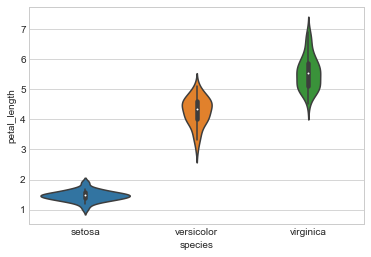

In [0]:
# A violin plot combines the benefits of the previous two plots 
#and simplifies them

# Denser regions of the data are fatter, and sparser ones thinner 
#in a violin plot

sns.violinplot(x="species", y="petal_length", data=iris, size=8)
plt.show()

#1. Petal Length of Setosa is normally distributed.
#2. I don't see the same about Versicolor and Virginica. Team, don't you think there is some skewness seen in other two plots? (Correct me, If I am wrong?) or is it just because of spread of data is high in virginica and versicolor?
#3. As we have seen Violin plot is nothing but the combination of PDF & Boxplot. Do you recommend using it over drawing each of them separately?

==================
1. Correct-------------
2. Yes, you are correct-----------------
3. recommend to plot any of those two either violin or boxplot

https://seaborn.pydata.org/generated/seaborn.violinplot.html

# (3.9) Summarizing plots in english
* Exaplain your findings/conclusions in plain english
* Never forget your objective (the probelm you are solving) . Perform all of your EDA aligned with your objectives.

# (3.10) Univariate, bivariate and multivariate analysis.


Univariate, Bivariate and Multivariate data and its analysis
1. Univariate data –
This type of data consists of only one variable. The analysis of univariate data is thus the simplest form of analysis since the information deals with only one quantity that changes. It does not deal with causes or relationships and the main purpose of the analysis is to describe the data and find patterns that exist within it. The example of a univariate data can be height.



Suppose that the heights of seven students of a class is recorded(figure 1),there is only one variable that is height and it is not dealing with any cause or relationship. The description of patterns found in this type of data can be made by drawing conclusions using central tendency measures (mean, median and mode), dispersion or spread of data (range, minimum, maximum, quartiles, variance and standard deviation) and by using frequency distribution tables, histograms, pie charts, frequency polygon and bar charts.



2. Bivariate data –
This type of data involves two different variables. The analysis of this type of data deals with causes and relationships and the analysis is done to find out the relationship among the two variables.Example of bivariate data can be temperature and ice cream sales in summer season.



Suppose the temperature and ice cream sales are the two variables of a bivariate data(figure 2). Here, the relationship is visible from the table that temperature and sales are directly proportional to each other and thus related because as the temperature increases, the sales also increase. Thus bivariate data analysis involves comparisons, relationships, causes and explanations. These variables are often plotted on X and Y axis on the graph for better understanding of data and one of these variables is independent while the other is dependent.

3. Multivariate data –
When the data involves three or more variables, it is categorized under multivariate. Example of this type of data is suppose an advertiser wants to compare the popularity of four advertisements on a website, then their click rates could be measured for both men and women and relationships between variables can then be examined.

It is similar to bivariate but contains more than one dependent variable. The ways to perform analysis on this data depends on the goals to be achieved.Some of the techniques are regression analysis,path analysis,factor analysis and multivariate analysis of variance (MANOVA).


# (3.11) Multivariate probability density, contour plot.


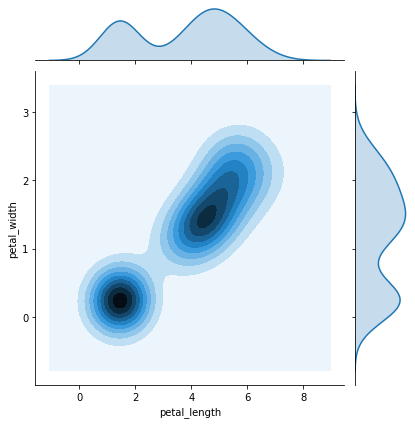

In [11]:
#2D Density plot, contors-plot
sns.jointplot(x="petal_length", y="petal_width", data=iris, kind="kde");
plt.show();


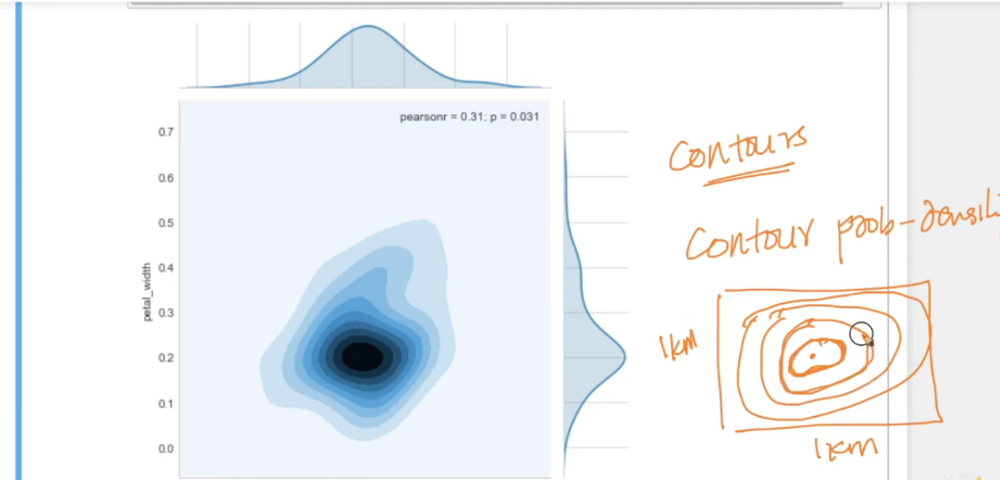

contour plots are nothing but 2d representations of a 3-d plot where each plot represent some constant value and all points in that contour plot if we apply some function it results to same constant value. n i see space between contour plots represents the step size that it took to reach that constant value , if there is less space btw contours then it takes less step size to get that constant value and if it is more it took larger step to get that value . it also represents the steepness of contour.

https://www.youtube.com/watch?v=WsZj5Rb6do8

# (3.12) Exercise:

1. Download Haberman Cancer Survival dataset from Kaggle. You may have to create a Kaggle account to donwload data. (https://www.kaggle.com/gilsousa/habermans-survival-data-set)
2. Perform a similar alanlaysis as above on this dataset with the following sections:
* High level statistics of the dataset: number of points, numer of   features, number of classes, data-points per class.
* Explain our objective. 
* Perform Univaraite analysis(PDF, CDF, Boxplot, Voilin plots) to understand which features are useful towards classification.
* Perform Bi-variate analysis (scatter plots, pair-plots) to see if combinations of features are useful in classfication.
* Write your observations in english as crisply and unambigously as possible. Always quantify your results.

In [0]:
iris_virginica_SW = iris_virginica.iloc[:,1]
iris_versicolor_SW = iris_versicolor.iloc[:,1]



In [0]:
from scipy import stats
stats.ks_2samp(iris_virginica_SW, iris_versicolor_SW)


In [0]:
x = stats.norm.rvs(loc=0.2, size=10)
stats.kstest(x,'norm')


In [0]:
x = stats.norm.rvs(loc=0.2, size=100)
stats.kstest(x,'norm')


In [0]:
x = stats.norm.rvs(loc=0.2, size=1000)
stats.kstest(x,'norm')


We can understand but we left that part for our student to learn from themselves ,from google as its pretty easy once you have grasp over matplotlib .
Here is a small series of videos to learn seaborn :
https://www.youtube.com/watch?v=z7ZINBk8EUk&list=PL998lXKj66MpNd0_XkEXwzTGPxY2jYM2d


# Comments:
iris["species"].value_counts()

iris["species"].value_counts(1)
what is difference between these two codes please explain

   Sep 08, 2018 08:06 AM
 AppliedAI Course 
There is a parameter called normalize in the value_counts()
normalize : boolean, default False
If True then the object returned will contain the relative frequencies of the unique values.

Difference between 1st and 2nd statement is normalise the value.
1. It will give frequency
2. It will give normalise value of each class. i.e 50/150 = 0.33

# Cheatsheet
https://s3.amazonaws.com/assets.datacamp.com/blog_assets/Python_Seaborn_Cheat_Sheet.pdf

Class label is sometime is provided in the information to you ,in sklearn we have toy datasets having target column specify using the dataset.target variable.

First identify the type of problem wether classification/regression then try to find the solution to the problem asked i.e what is asked.Try search the columns of the dataset to find the variable to be predicted.It will come with practice.Just bear with the lectures.

========================================================================================================================
Basically what Facet does is , it creates a matrix of plots according to the row , col , hue give inside the facetgrid function. and the map function plots the graph in each of the plots created by the facetgrid matrix.

---------------------------------------------------------------------------------------------------
in 2D scatter plot, we have
sns.FacetGrid(iris,hue='species',size=4)

and in 3D scatter plot, we have
sns.pairplot(iris, hue="species",size=3)

what does exactly the size referring to? is it width or length

   Aug 29, 2018 17:03 PM
 AppliedAI Course 
(height and width of the plot and it's measurement is inch